# Topic Modelling 

* Topic modeling is a type of statistical modeling that uses unsupervised Machine Learning to identify clusters or groups of similar words within a body of text. 
* This text mining method uses semantic structures in text to understand unstructured data without predefined tags or training data.

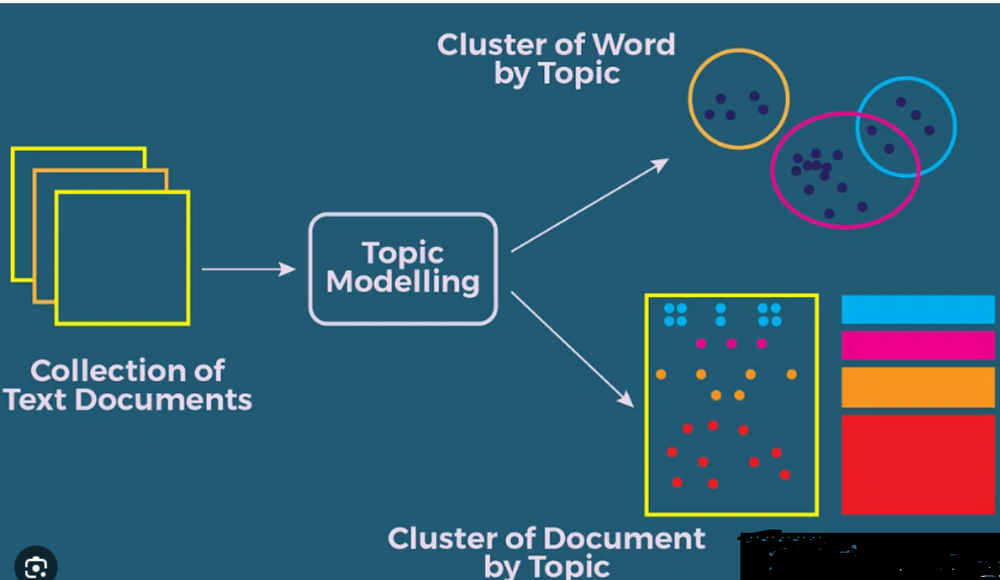

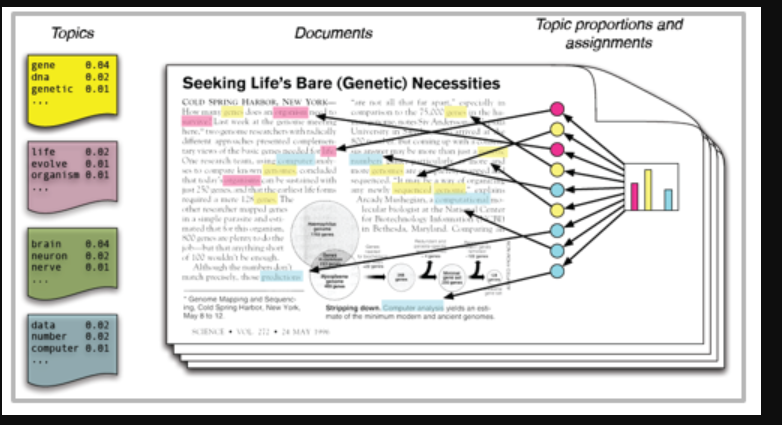

==================================================================================================

# LDA Model 

* Topic Modeling is a technique to extract the hidden topics from large volumes of text. 
* Latent Dirichlet Allocation(LDA) is a popular algorithm for topic modeling with excellent implementations in the Python’s Gensim package.

https://monkeylearn.com/blog/introduction-to-topic-modeling/ 

#### Contents
* introduction to topic modelling
* understanding gensim library
* Using Regular expressions 
* Data Preprocessing (removal of emails and new lines nd formats)
* Bag of words concept
* Exploratory Data Analysis for text data
* Understanding Bigram and Trigram 
* making LDA input and encoding of text data 
* creating LDA models 
* Selecting the number of topics 
* Model Evaluation


https://www.kdnuggets.com/2023/01/topic-modeling-approaches-top2vec-bertopic.html
    
https://pub.towardsai.net/topic-modeling-for-e-commerce-reviews-using-bertopic-b1b9e85c710b


https://towardsdatascience.com/let-us-extract-some-topics-from-text-data-part-iv-bertopic-46ddf3c91622

In [40]:
import pandas as pd

import numpy as np


import warnings

warnings.filterwarnings("ignore", category = DeprecationWarning)

# LEARN TO READ JSON

In [41]:
df = pd.read_json('newsgroups.json')

df

,content,target,target_names
0,From: lerxst@wam.umd.edu (where's my thing)\nS...,7,rec.autos
1,From: guykuo@carson.u.washington.edu (Guy Kuo)...,4,comp.sys.mac.hardware
2,From: twillis@ec.ecn.purdue.edu (Thomas E Will...,4,comp.sys.mac.hardware
3,From: jgreen@amber (Joe Green)\nSubject: Re: W...,1,comp.graphics
4,From: jcm@head-cfa.harvard.edu (Jonathan McDow...,14,sci.space
...,...,...,...
11309,From: jim.zisfein@factory.com (Jim Zisfein) \n...,13,sci.med
11310,From: ebodin@pearl.tufts.edu\nSubject: Screen ...,4,comp.sys.mac.hardware
11311,From: westes@netcom.com (Will Estes)\nSubject:...,3,comp.sys.ibm.pc.hardware
11312,From: steve@hcrlgw (Steven Collins)\nSubject: ...,1,comp.graphics


name:john
age:20
------------
name,age
john,20
ann,30
---------------------------
    
{
    "name":"john",
    "age":20
},

{ 
    "name":"ann",
    "age":30
    
}




In [42]:
df.head(1)["content"]

0    From: lerxst@wam.umd.edu (where's my thing)\nS...
Name: content, dtype: object

In [43]:
data = df.content.values.tolist()

data


["From: lerxst@wam.umd.edu (where's my thing)\nSubject: WHAT car is this!?\nNntp-Posting-Host: rac3.wam.umd.edu\nOrganization: University of Maryland, College Park\nLines: 15\n\n I was wondering if anyone out there could enlighten me on this car I saw\nthe other day. It was a 2-door sports car, looked to be from the late 60s/\nearly 70s. It was called a Bricklin. The doors were really small. In addition,\nthe front bumper was separate from the rest of the body. This is \nall I know. If anyone can tellme a model name, engine specs, years\nof production, where this car is made, history, or whatever info you\nhave on this funky looking car, please e-mail.\n\nThanks,\n- IL\n   ---- brought to you by your neighborhood Lerxst ----\n\n\n\n\n",
 "From: guykuo@carson.u.washington.edu (Guy Kuo)\nSubject: SI Clock Poll - Final Call\nSummary: Final call for SI clock reports\nKeywords: SI,acceleration,clock,upgrade\nArticle-I.D.: shelley.1qvfo9INNc3s\nOrganization: University of Washington\nLines: 

## Data Cleaning 
#### Removing the emails adresses
Replace :****
\S*@\S*\s?
by ''

Demo here

Some explanations :
\S* : match as many non-space characters you can
@ : then a @
\S* : then another sequence of non-space characters
\s? : And eventually a space, if there is one. Note that the '?' is needed to match an address at the end of the line. Because of the greediness of '?', if there is a space, it will always be matched.

﻿

In [44]:
# Remove Emails
import re

data = [re.sub('\S*@\S*\s?', '', sent) for sent in data]

data


["From: (where's my thing)\nSubject: WHAT car is this!?\nNntp-Posting-Host: rac3.wam.umd.edu\nOrganization: University of Maryland, College Park\nLines: 15\n\n I was wondering if anyone out there could enlighten me on this car I saw\nthe other day. It was a 2-door sports car, looked to be from the late 60s/\nearly 70s. It was called a Bricklin. The doors were really small. In addition,\nthe front bumper was separate from the rest of the body. This is \nall I know. If anyone can tellme a model name, engine specs, years\nof production, where this car is made, history, or whatever info you\nhave on this funky looking car, please e-mail.\n\nThanks,\n- IL\n   ---- brought to you by your neighborhood Lerxst ----\n\n\n\n\n",
 "From: (Guy Kuo)\nSubject: SI Clock Poll - Final Call\nSummary: Final call for SI clock reports\nKeywords: SI,acceleration,clock,upgrade\nArticle-I.D.: shelley.1qvfo9INNc3s\nOrganization: University of Washington\nLines: 11\nNNTP-Posting-Host: carson.u.washington.edu\n\n

In [45]:

# Remove new line characters
data = [re.sub('\s+', ' ', sent) for sent in data]


In [46]:
data = pd.Series(data)


In [47]:
# lets do some preprocessing and move on 
# here we are going to use regex for data cleaning

import re

data_processed = data.apply(lambda x: re.sub(r'[^a-zA-Z/s]+',' ',x).lower())

data_processed

0        from where s my thing subject what car is this...
1        from guy kuo subject si clock poll final call ...
2        from thomas e willis subject pb questions orga...
3        from joe green subject re weitek p organizatio...
4        from jonathan mcdowell subject re shuttle laun...
                               ...                        
11309    from jim zisfein subject re migraines and scan...
11310    from subject screen death mac plus/ lines orga...
11311    from will estes subject mounting cpu cooler in...
11312    from steven collins subject re sphere from poi...
11313    from kevin j gunning subject stolen cbr rr org...
Length: 11314, dtype: object

In [48]:
import nltk

nltk.download('stopwords')

nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\admin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\admin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [49]:
# now lets deal with stopwords 
# using nltk stopwords 

from nltk.corpus import stopwords

stop_words = stopwords.words('english')


stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

len(stop_words)



184

In [50]:
from nltk import word_tokenize


In [51]:
data_final = data_processed.apply(lambda x:' '.join([word for word in word_tokenize(x) 
                                        if word not in stop_words and len(word)> 2]))

In [52]:
data_final[0]

'thing car nntp posting host rac wam umd organization university maryland college park lines wondering anyone could enlighten car saw day door sports car looked late early called bricklin doors really small addition front bumper separate rest body know anyone tellme model name engine specs years production car made history whatever info funky looking car please mail thanks brought neighborhood lerxst'

## Lets do some EDa

In [53]:
words_list = []

for sentence in data_final:
    words_list.extend(nltk.word_tokenize(sentence))
    
freq_dist = nltk.FreqDist(words_list)

freq_dist.most_common(20)

# freq_dist.keys()

[('lines', 11832),
 ('organization', 11208),
 ('one', 9014),
 ('would', 8906),
 ('writes', 7840),
 ('article', 7434),
 ('people', 5976),
 ('like', 5855),
 ('university', 5583),
 ('posting', 5506),
 ('know', 5134),
 ('get', 4995),
 ('host', 4984),
 ('nntp', 4808),
 ('think', 4542),
 ('max', 4389),
 ('also', 4307),
 ('time', 4083),
 ('new', 3966),
 ('good', 3739)]

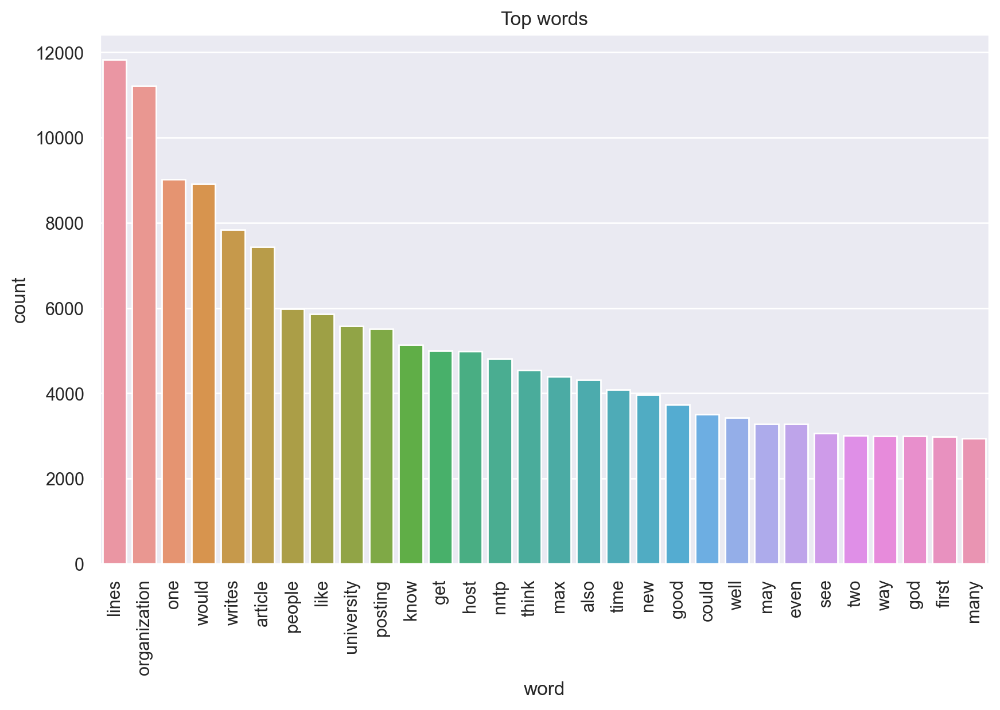

In [54]:
# creating a temporary dataframe and plotting the graph
%config InlineBackend.figure_format = 'retina'

import matplotlib.pyplot as plt
import seaborn as sns

sns.set()
temp = pd.DataFrame(freq_dist.most_common(30),  columns=['word', 'count'])
fig, ax = plt.subplots(figsize=(10, 6))

sns.barplot(x='word', y='count', 
            data=temp, ax=ax)


plt.title("Top words")

plt.xticks(rotation='vertical');

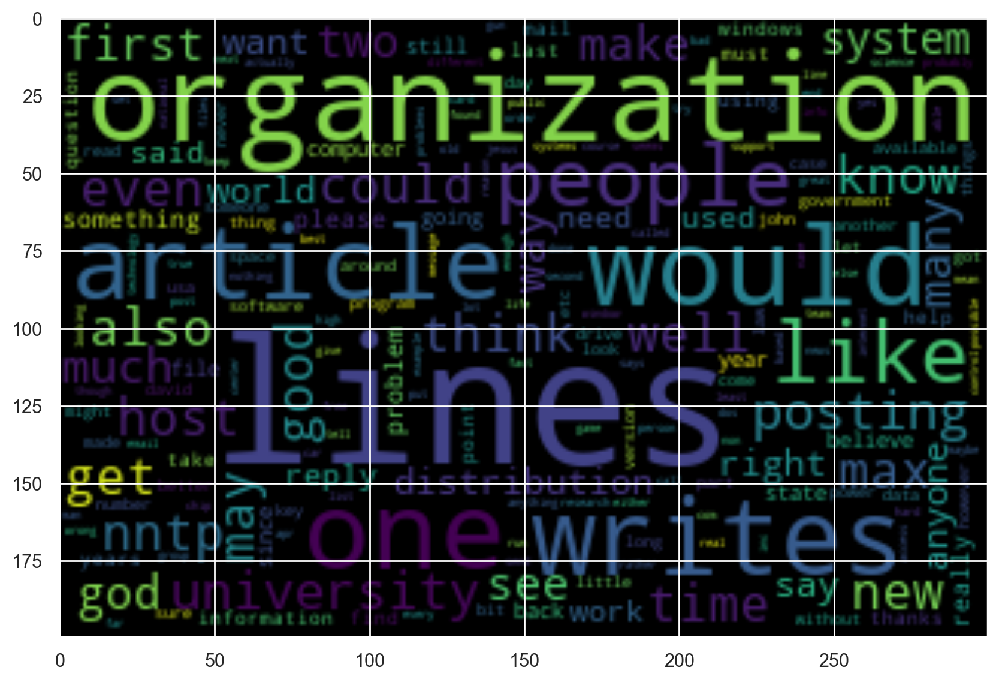

In [55]:
%config InlineBackend.figure_format = 'retina'

from wordcloud import WordCloud

import wordcloud

# creation of wordcloud
wcloud_fig = WordCloud( stopwords=set(wordcloud.STOPWORDS),
                      colormap='viridis', width=300, height=200).generate_from_frequencies(freq_dist)

# plotting the wordcloud
plt.figure(figsize=(10,7), frameon=True)

plt.imshow(wcloud_fig, interpolation  = 'bilinear')

plt.show()

# ## now lets create a Bigram and trigram for more sense

Bigrams are two words frequently occurring together in the document. Trigrams are 3 words frequently occurring.

Some examples in our example are: ‘front_bumper’, ‘oil_leak’, ‘maryland_college_park’ etc.

Gensim’s Phrases model can build and implement the bigrams, trigrams, quadgrams and more. The two important arguments to Phrases are min_count and threshold. The higher the values of these param, the harder it is for words to be combined to bigrams.


In [56]:
#loading libraries 

import gensim

from gensim.models import Phrases

from gensim.models.phrases import Phraser

from gensim import models


In [57]:
words_sent = [x.split() for x in data_final]
words_sent

bigram = Phrases(words_sent, min_count=5, threshold=100)

trigram = Phrases(bigram[words_sent], threshold=100)  

bigram_phraser = Phraser(bigram)
trigram_phraser = Phraser(trigram)

# bow = [bigram_phraser[word] for word in words_sent] # creating bigram
bow = [trigram_phraser[bigram_phraser[word]] for word in words_sent] # creating trigram and bigrambb 

In [58]:
bow[0:1]

[['thing',
  'car',
  'nntp_posting_host',
  'rac_wam_umd',
  'organization',
  'university',
  'maryland_college_park',
  'lines',
  'wondering',
  'anyone',
  'could',
  'enlighten',
  'car',
  'saw',
  'day',
  'door',
  'sports_car',
  'looked',
  'late',
  'early',
  'called',
  'bricklin',
  'doors',
  'really',
  'small',
  'addition',
  'front_bumper',
  'separate',
  'rest',
  'body',
  'know',
  'anyone',
  'tellme',
  'model',
  'name',
  'engine',
  'specs',
  'years',
  'production',
  'car',
  'made',
  'history',
  'whatever',
  'info',
  'funky',
  'looking',
  'car',
  'please',
  'mail',
  'thanks',
  'brought',
  'neighborhood',
  'lerxst']]

In [59]:
### lemmatisation by using spacy and pos tagging

import spacy

nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner']) # disabing the parse and ner from pipeline it increase speed of pipeline

# here 'en' in spacy pipeline means the small version of language

!python -m spacy download en_core_web_sm

In [60]:
doc = nlp(' '.join(bow[0]))

for token in doc:
    print(token ,'=>', token.pos_)

thing => NOUN
car => NOUN
nntp_posting_host => NUM
rac_wam_umd => NOUN
organization => NOUN
university => NOUN
maryland_college_park => PROPN
lines => NOUN
wondering => VERB
anyone => PRON
could => AUX
enlighten => VERB
car => NOUN
saw => VERB
day => NOUN
door => NOUN
sports_car => NOUN
looked => VERB
late => ADV
early => ADV
called => VERB
bricklin => PROPN
doors => NOUN
really => ADV
small => ADJ
addition => NOUN
front_bumper => NUM
separate => ADJ
rest => NOUN
body => NOUN
know => VERB
anyone => PRON
tellme => ADP
model => NOUN
name => NOUN
engine => NOUN
specs => NOUN
years => NOUN
production => NOUN
car => NOUN
made => VERB
history => NOUN
whatever => DET
info => NOUN
funky => ADJ
looking => VERB
car => NOUN
please => INTJ
mail => NOUN
thanks => NOUN
brought => VERB
neighborhood => NOUN
lerxst => NOUN


In [61]:
# now lemmatising the whole corpus so that we can reach to the root words 

def lemmatization(texts, tags=['NOUN', 'ADJ', 'VERB', 'ADV','PROPN']): # filter noun and adjective
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in tags])
    return texts_out


In [62]:
bag_of_words = lemmatization(bow)


In [63]:
bag_of_words[0]

['thing',
 'car',
 'rac_wam_umd',
 'organization',
 'university',
 'maryland_college_park',
 'line',
 'wonder',
 'enlighten',
 'car',
 'see',
 'day',
 'door',
 'sports_car',
 'look',
 'late',
 'early',
 'call',
 'bricklin',
 'door',
 'really',
 'small',
 'addition',
 'separate',
 'rest',
 'body',
 'know',
 'model',
 'name',
 'engine',
 'spec',
 'year',
 'production',
 'car',
 'make',
 'history',
 'info',
 'funky',
 'look',
 'car',
 'mail',
 'thank',
 'bring',
 'neighborhood',
 'lerxst']

## now we need to encode the whole corpus into some numbers 
The two main inputs to the LDA topic model are the dictionary(id2word) and the corpus. Let’s create them.

In [64]:
from gensim import corpora

id2word = corpora.Dictionary(bag_of_words)

print(id2word)

# here keys are some numbers and values are our words

Dictionary<76263 unique tokens: ['addition', 'body', 'bricklin', 'bring', 'call']...>


In [65]:
bag_of_words

[['thing',
  'car',
  'rac_wam_umd',
  'organization',
  'university',
  'maryland_college_park',
  'line',
  'wonder',
  'enlighten',
  'car',
  'see',
  'day',
  'door',
  'sports_car',
  'look',
  'late',
  'early',
  'call',
  'bricklin',
  'door',
  'really',
  'small',
  'addition',
  'separate',
  'rest',
  'body',
  'know',
  'model',
  'name',
  'engine',
  'spec',
  'year',
  'production',
  'car',
  'make',
  'history',
  'info',
  'funky',
  'look',
  'car',
  'mail',
  'thank',
  'bring',
  'neighborhood',
  'lerxst'],
 ['guy_kuo',
  'clock',
  'poll',
  'final',
  'call',
  'summary',
  'final',
  'call',
  'clock',
  'report',
  'keyword',
  'acceleration',
  'clock',
  'upgrade',
  'qvfo',
  'innc',
  'organization',
  'university',
  'washington',
  'lines_nntp_poste',
  'host',
  'carson_washington',
  'fair',
  'number',
  'brave',
  'soul',
  'upgrade',
  'clock',
  'oscillator',
  'share',
  'experience',
  'poll',
  'send',
  'brief',
  'message',
  'detail',
  'e

In [66]:
#  now lets create a encoded bag of words 

corpus_matrix = [id2word.doc2bow(sent) for sent in bag_of_words]


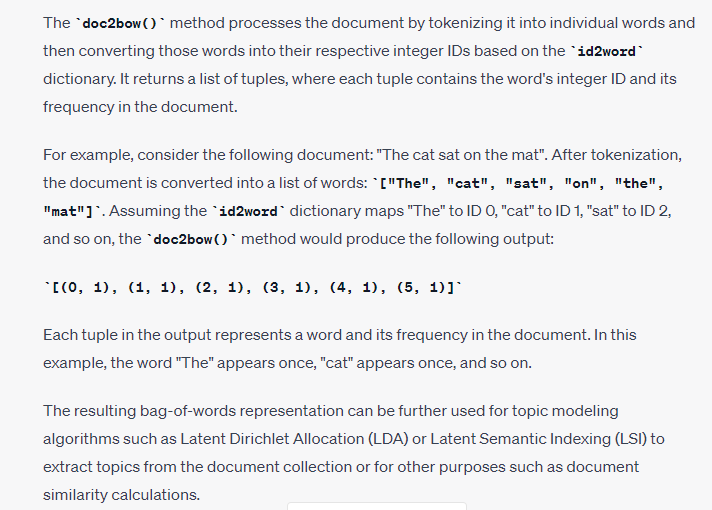

In [67]:
corpus_matrix[0]


[(0, 1),
 (1, 1),
 (2, 1),
 (3, 1),
 (4, 1),
 (5, 4),
 (6, 1),
 (7, 2),
 (8, 1),
 (9, 1),
 (10, 1),
 (11, 1),
 (12, 1),
 (13, 1),
 (14, 1),
 (15, 1),
 (16, 1),
 (17, 1),
 (18, 2),
 (19, 1),
 (20, 1),
 (21, 1),
 (22, 1),
 (23, 1),
 (24, 1),
 (25, 1),
 (26, 1),
 (27, 1),
 (28, 1),
 (29, 1),
 (30, 1),
 (31, 1),
 (32, 1),
 (33, 1),
 (34, 1),
 (35, 1),
 (36, 1),
 (37, 1),
 (38, 1),
 (39, 1)]

In [68]:
### Now create our model by using gensim lda

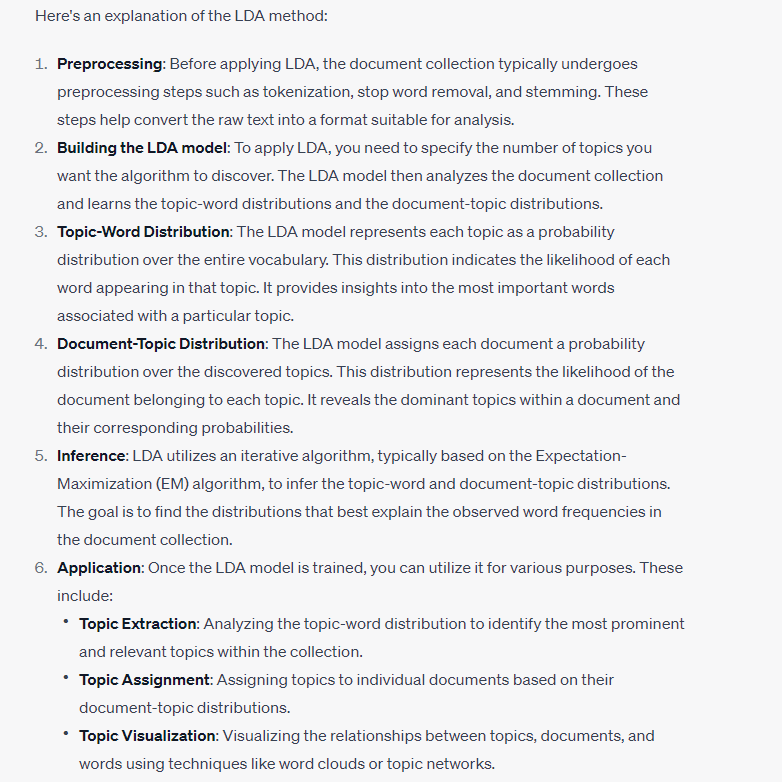

In [69]:
from gensim import models


??models.flsamodel.FlsaModel

Object `models.flsamodel.FlsaModel` not found.


In [70]:
# Creating the object for LDA model using gensim library

from gensim import models

import gensim

LDA = gensim.models.ldamodel.LdaModel

# Build LDA model 
lda_model = LDA( corpus=corpus_matrix,
                 id2word=id2word,
                                    num_topics=5, 
                
                                    random_state=100,
                
                                           update_every=1, #doc-matrix
                                           chunksize=100, #num of docs
                
                                           passes=5,
                                           alpha='auto', #dirichlet distribution parameter
                                           per_word_topics=True)

In [71]:
??LDA

In [72]:
lda_model.alpha

array([0.12126522, 1.2108445 , 0.5470217 , 0.12325533, 0.31234694],
      dtype=float32)

where a higher value of alpha encourages documents to contain a mixture of many topics, and a lower value encourages documents to be more focused on a few dominant topics.

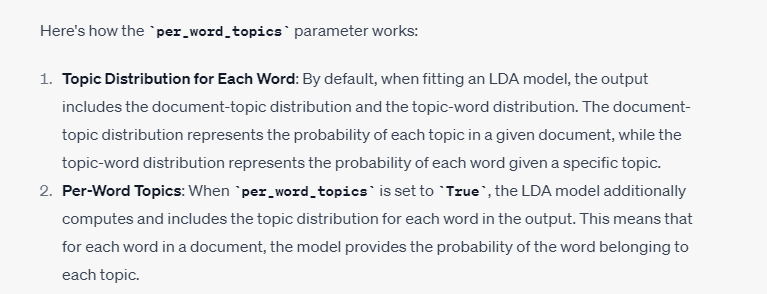

In [73]:
corpus_matrix


[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 4),
  (6, 1),
  (7, 2),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 2),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1)],
 [(4, 2),
  (6, 2),
  (25, 1),
  (35, 1),
  (37, 1),
  (40, 1),
  (41, 1),
  (42, 2),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 5),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 2),
  (56, 1),
  (57, 2),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 2),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 1),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 3),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 1),
  (83, 2),
  (84, 1),
  (85, 1),
  (86, 1),

In [74]:

lda_model.print_topics()

# doc_lda = lda_model[corpus_matrix]

[(0,
  '0.014*"space" + 0.009*"bike" + 0.007*"car" + 0.007*"o" + 0.006*"engine" + 0.006*"nasa" + 0.005*"c" + 0.005*"launch" + 0.004*"ride" + 0.004*"orbit"'),
 (1,
  '0.016*"organization" + 0.014*"line" + 0.011*"write" + 0.011*"get" + 0.009*"article" + 0.006*"good" + 0.006*"well" + 0.006*"know" + 0.005*"university" + 0.005*"time"'),
 (2,
  '0.011*"people" + 0.011*"god" + 0.010*"say" + 0.008*"write" + 0.007*"think" + 0.007*"make" + 0.007*"know" + 0.006*"believe" + 0.006*"reason" + 0.006*"evidence"'),
 (3,
  '0.012*"israel" + 0.011*"government" + 0.006*"state" + 0.005*"president" + 0.005*"say" + 0.005*"people" + 0.005*"war" + 0.005*"israeli" + 0.004*"armenian" + 0.004*"lebanese"'),
 (4,
  '0.011*"use" + 0.010*"system" + 0.009*"key" + 0.008*"file" + 0.008*"window" + 0.008*"program" + 0.006*"drive" + 0.006*"line" + 0.006*"mac" + 0.005*"need"')]

In [75]:
lda_model.get_topic_terms(0)


[(893, 0.013581057),
 (539, 0.009011357),
 (5, 0.007465185),
 (5813, 0.0066650873),
 (9, 0.005743418),
 (2987, 0.0055677528),
 (9637, 0.0052689747),
 (237, 0.0049176333),
 (2762, 0.0044741775),
 (849, 0.0041731247)]

In [76]:
lda_model.get_term_topics(893)


[(0, 0.0135785425)]

In [77]:
lda_model.get_document_topics("")


[(0, 0.052388407),
 (1, 0.5231032),
 (2, 0.23632164),
 (3, 0.053248167),
 (4, 0.1349386)]

### Visualisation of topic modelling

! pip install pyLDAvis


In [80]:
#import pyLDAvis

import pyLDAvis.gensim

import matplotlib.pyplot as plt
#import seaborn as sns

%matplotlib inline

In [83]:
# Visualize the topics

fig, ax = plt.subplots(figsize=(10, 10))

pyLDAvis.enable_notebook()

In [84]:



vis = pyLDAvis.gensim.prepare(lda_model, corpus = corpus_matrix, dictionary = id2word)

vis

#https://we1s.ucsb.edu/research/we1s-tools-and-software/topic-model-observatory/tmo-guide/tmo-guide-pyldavis/#:~:text=In%20using%20pyLDAvis%2C%20you%20should,the%20scale%20to%20%CE%BB%20%3D%200.6.

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.178090 -0.018947       1        1  40.211609
2      0.184667  0.075769       2        1  29.304062
4      0.072316 -0.238267       3        1  17.307808
3     -0.080422  0.258771       4        1   7.857214
0     -0.354651 -0.077326       5        1   5.319307, topic_info=        Term         Freq        Total Category  logprob  loglift
626      god  4405.000000  4405.000000  Default  30.0000  30.0000
145   people  5813.000000  5813.000000  Default  29.0000  29.0000
893    space  1523.000000  1523.000000  Default  28.0000  28.0000
338      say  6444.000000  6444.000000  Default  27.0000  27.0000
810      key  2256.000000  2256.000000  Default  26.0000  26.0000
...      ...          ...          ...      ...      ...      ...
5        car   561.478014  1625.002608   Topic5  -4.8975   1.8711
1793     pat   197.481821   241.313268   Topic5  -5.9424   2.7334
3790     van   205.141369   339.085272   Topic5  -5.9044   2.4313
1645   earth   240.219834   797.224889   Topic5  -5.7465   1.7342
544      dod   189.132236   261.880238   Topic5  -5.9856   2.6084

[324 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
1626      1  0.085295     accept
1626      2  0.913162     accept
263       1  0.136263      agree
263       2  0.863667      agree
2689      3  0.998531  algorithm
...     ...       ...        ...
218       2  0.325356      write
218       3  0.048888      write
39        1  0.838334       year
39        2  0.065981       year
39        4  0.095581       year

[486 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 3, 5, 4, 1])